In [98]:
import tensorflow as tf
import numpy as np
import os
from PIL import Image

In [99]:
labels = ['Palm','Fist']
y_train = []
y_train_pos = []
x_train = []
path = "Data/Images"
for i in os.listdir(path):
    for j in os.listdir(path + "/" + i):
        im =  Image.open(path + "/" + i + '/' + j)
        im = im.resize((240,240), Image.LANCZOS)
        im = np.array(im)
        #im = np.expand_dims(im,axis = 2)
        x_train.append(im)
        y_train.append(labels.index(i))

x = np.array(x_train)
y = tf.keras.utils.to_categorical(y_train)

print(x.shape)
print(y.shape)

(202, 240, 240, 3)
(202, 2)
(202, 2)


In [100]:
from sklearn.model_selection import train_test_split

x_train, x_val, y_train, y_val = train_test_split(x, y, train_size=0.80, random_state=42)

In [101]:
input = tf.keras.layers.Input(shape=(240, 240, 3))
x = tf.keras.layers.Conv2D(16, (3, 3), activation='relu')(input)
x = tf.keras.layers.MaxPooling2D(pool_size=(2, 2))(x)
x = tf.keras.layers.Conv2D(32, (3, 3), activation='relu')(x)
x = tf.keras.layers.MaxPooling2D(pool_size=(2, 2))(x)
x = tf.keras.layers.Conv2D(64, (3, 3), activation='relu')(x)
x = tf.keras.layers.MaxPooling2D(pool_size=(2, 2))(x)
x = tf.keras.layers.Conv2D(128, (3, 3), activation='relu')(x)
x = tf.keras.layers.MaxPooling2D(pool_size=(2, 2))(x)
x = tf.keras.layers.Flatten()(x)

x = tf.keras.layers.Dense(32, activation='relu', kernel_regularizer = tf.keras.regularizers.l1_l2(l1 = 0.05,l2 = 0.5), bias_regularizer=tf.keras.regularizers.l2(0.1))(x)
x = tf.keras.layers.Dense(2, activation='softmax', kernel_regularizer = tf.keras.regularizers.l1_l2(l1 = 0.05,l2 = 0.5), bias_regularizer=tf.keras.regularizers.l2(0.1))(x)


model = tf.keras.Model(input, x)

model.compile(optimizer='adam', loss='categorical_crossentropy', metrics='accuracy')

model.fit(x_train, y_train, epochs=1000, batch_size=64, validation_data=(x_val, y_val))

Epoch 1/1000
3/3 [==============================] - 3s 570ms/step - loss: 13407.5420 - classification_loss: 68.8819 - regression_loss: 12735.1729 - classification_accuracy: 0.5031 - regression_mae: 83.8819 - val_loss: 778.9368 - val_classification_loss: 1.9375 - val_regression_loss: 275.0280 - val_classification_accuracy: 0.5366 - val_regression_mae: 16.2995
Epoch 2/1000
3/3 [==============================] - 1s 414ms/step - loss: 698.7653 - classification_loss: 9.7929 - regression_loss: 216.6087 - classification_accuracy: 0.5342 - regression_mae: 12.9933 - val_loss: 482.3600 - val_classification_loss: 8.9663 - val_regression_loss: 73.0284 - val_classification_accuracy: 0.4634 - val_regression_mae: 8.3908
Epoch 3/1000
3/3 [==============================] - 1s 421ms/step - loss: 434.4654 - classification_loss: 4.4872 - regression_loss: 50.4987 - classification_accuracy: 0.5280 - regression_mae: 6.3156 - val_loss: 336.1555 - val_classification_loss: 3.2580 - val_regression_loss: 2.8485 -

In [103]:
# Execute Cell Index 3 first to define and train the model

model.evaluate(x_val, y_val)


2/2 [==============================] - 0s 24ms/step - loss: 14.9820 - classification_loss: 0.2321 - regression_loss: 0.0857 - classification_accuracy: 0.9024 - regression_mae: 0.1994


[14.981968879699707,
 0.23213142156600952,
 0.08574860543012619,
 0.9024389982223511,
 0.19941429793834686]

In [109]:
predictions = model.predict(x_val[0].reshape(1, 240, 240, 3))
classification_output = predictions[0]
regression_output = predictions[1]

print(classification_output)
print(regression_output)



1/1 [==============================] - 0s 414ms/step
[[0.00104894 0.9989511 ]]
[[-0.01041184  1.1668065 ]]


In [104]:
import tf2onnx

tf2onnx.convert.from_keras(model, output_path="hand_position.onnx")

(ir_version: 8
 opset_import {
   domain: ""
   version: 15
 }
 opset_import {
   domain: "ai.onnx.ml"
   version: 2
 }
 producer_name: "tf2onnx"
 producer_version: "1.16.1 15c810"
 graph {
   node {
     input: "input_25"
     output: "model_24/conv2d_96/BiasAdd__86:0"
     name: "model_24/conv2d_96/BiasAdd__86"
     op_type: "Transpose"
     attribute {
       name: "perm"
       type: INTS
       ints: 0
       ints: 3
       ints: 1
       ints: 2
     }
   }
   node {
     input: "model_24/conv2d_96/BiasAdd__86:0"
     input: "model_24/conv2d_96/Conv2D/ReadVariableOp:0"
     input: "model_24/conv2d_96/BiasAdd/ReadVariableOp:0"
     output: "model_24/conv2d_96/BiasAdd:0"
     name: "model_24/conv2d_96/BiasAdd"
     op_type: "Conv"
     domain: ""
     attribute {
       name: "dilations"
       type: INTS
       ints: 1
       ints: 1
     }
     attribute {
       name: "strides"
       type: INTS
       ints: 1
       ints: 1
     }
     attribute {
       name: "kernel_shape"
  

[[0.00104894 0.9989511 ]]
[[-0.01041184  1.1668061 ]]


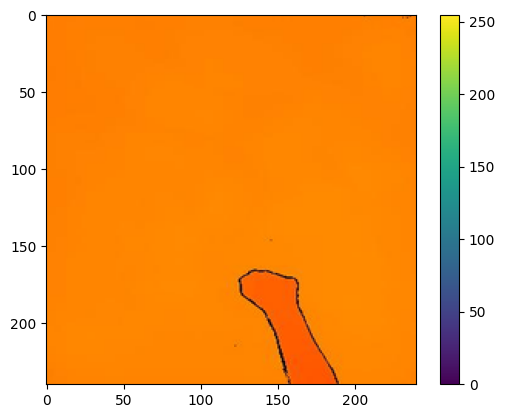

Fist


In [108]:
import onnxruntime
import matplotlib.pyplot as plt

img = x_val[0]


# Load the ONNX model
sess = onnxruntime.InferenceSession("hand_position.onnx")
intput_name = sess.get_inputs()[0].name
output1_name = sess.get_outputs()[0].name
output2_name = sess.get_outputs()[1].name
image = img.astype(np.float32)

onnx_predicted_label, ypo = sess.run(output_names=[output1_name, output2_name], input_feed={intput_name: image.reshape(1,240,240,3)})
print(onnx_predicted_label)
print(ypo)

plt.figure()
plt.imshow(img)
plt.colorbar()
plt.grid(False)
plt.show()
print(labels[np.argmax(onnx_predicted_label)])

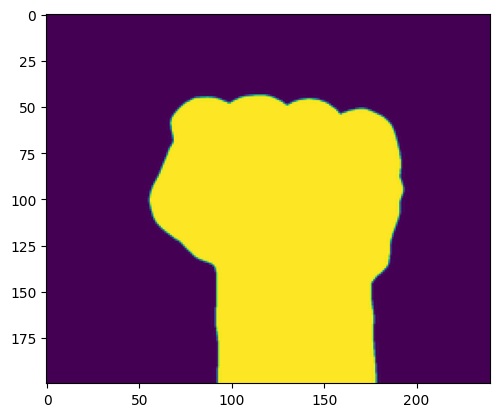

(1, 200, 240, 1)


In [41]:
img = Image.open("okay3.png")
for i in range(img.size[0]):
    for j in range(img.size[1]):
        if img.getpixel((i, j))[0] > 230 and img.getpixel((i, j))[1] > 230 and img.getpixel((i, j))[2] > 230:
            img.putpixel((i, j), (0,0,0))
        else:
            img.putpixel((i, j), (255, 255, 255))
img = img.convert('L')
img = img.resize((240, 200), Image.LANCZOS)
img = np.array(img)
plt.imshow(img)
plt.show()
img = img.reshape(1, 200, 240, 1)
print(img.shape)


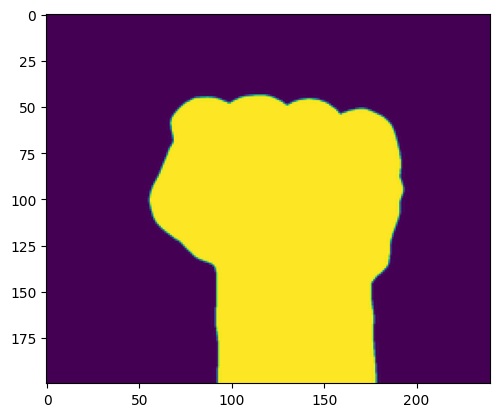

rock
[array([[3.1971749e-07, 1.3945986e-08, 9.9999964e-01]], dtype=float32)]


In [42]:
predictions = onnx_predicted_label = sess.run(output_names=[output_name], input_feed={intput_name: img.astype(np.float32)})
plt.imshow(img.reshape(200, 240))
plt.show()
print(labels[np.argmax(predictions)])
print(predictions)